<a href="https://colab.research.google.com/github/shreyaallupati/dog-breed-identification/blob/main/dog_breed_identification_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multi-dog dog breed classification

this notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and tensorflow hub.

## 1. problem

identifying the breed of the dog given image of a dog.

## 2. data

the data we have used is from kaggle's dog breed identification competition.  
https://www.kaggle.com/c/dog-breed-identification/data

## 3. evaluation

the evaluation is a file with prediction probabilites for each dog breed of each test image.

## 4. Features

Some information of data:
* we are dealing with images (unstructred data) so we probably use deep learning/transfer learning
* there are 120 breeds of dogs (this means there are 120 different classes).
* there are around 10,000+ images in training set (these images have labels)
* there are around 10,000+ images in test set (these images have no labels, we will predict the labels)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### getting our workspace ready

* import tensor flow 2.x
* import tensor flow hub
* make sure we are using GPU

In [ ]:
# import tensorflow into colab
import tensorflow as tf
print(tf.__version__)

2.15.0


In [ ]:
# importing libraries
import tensorflow as tf
import tensorflow_hub as hub

# check for GPU
tf.config.list_physical_devices('GPU')

[]

## getting our data ready ( turning our images into tensors )

In [ ]:
# checkout labels of our data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/dog vision/dog-breed-identification (1)/labels.csv')
print(labels_csv.head())
print(labels_csv.describe())


                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


<Axes: xlabel='breed'>

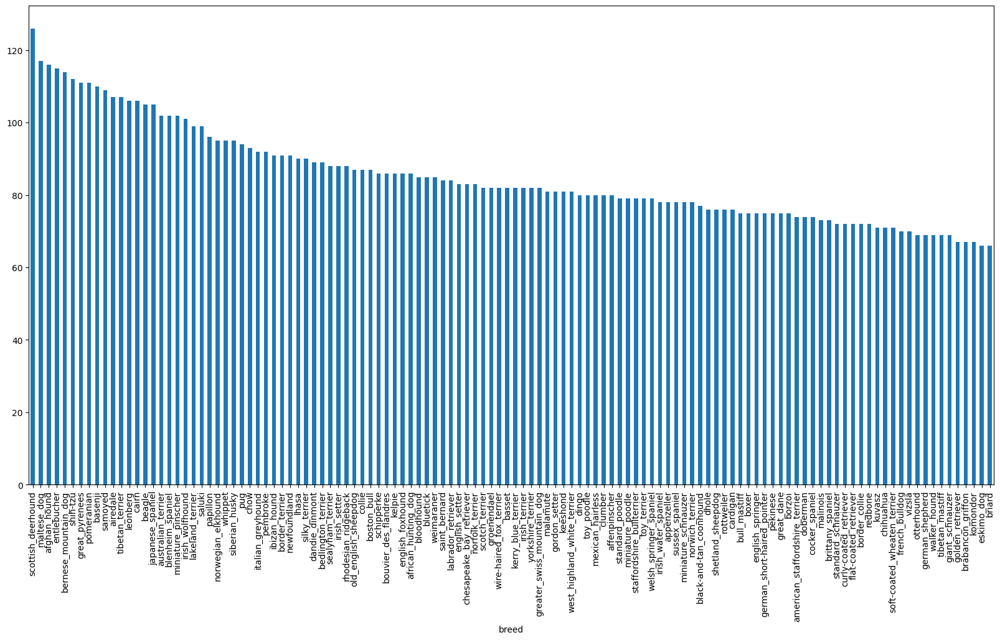

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

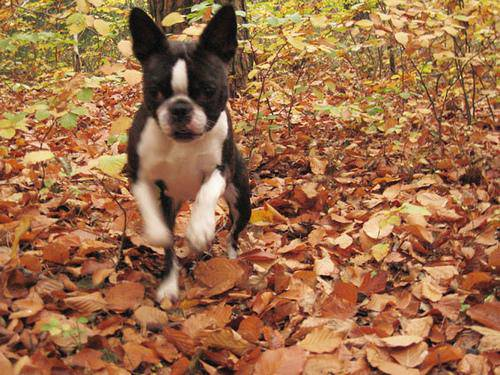

In [ ]:
# lets view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog vision/dog-breed-identification (1)/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### getting iimages and labels

lets get a list of all our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# create pathnames from image IDs
filenames = ["drive/MyDrive/dog vision/dog-breed-identification (1)/train/" + fname + ".jpg" for fname in labels_csv['id']]
filenames[:5]

['drive/MyDrive/dog vision/dog-breed-identification (1)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# check whether no of filenames matches number of actual image files
import os
if len(filenames) == len(os.listdir("/content/drive/MyDrive/dog vision/dog-breed-identification (1)/train")):
  print("filenames matches number of actual image files")
else:
  print("filenames does not match number of actual image files")

filenames matches number of actual image files


tibetan_mastiff


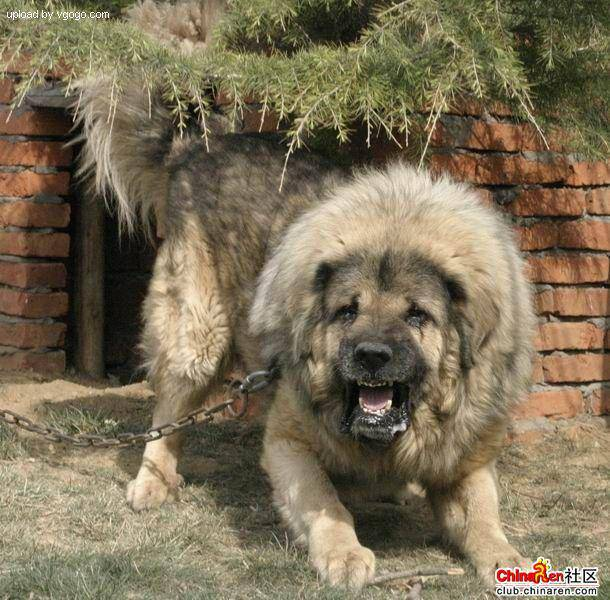

In [ ]:
print(labels_csv['breed'][9000])
Image(filenames[9000])


since we have now got our training image file paths in a list, lets prepare our labels

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)


10222

In [ ]:
# see if number of labels matches in the number of filenames
if len(labels) == len(filenames):
  print("number of labels matches number of filenames")
else:
  print("number of labels does not match number of filenames, check data directories")

number of labels matches number of filenames


In [ ]:
# find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# turn a single label into array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turn every label into a boolean label
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(labels),len(boolean_labels)

(10222, 10222)

In [ ]:
# example : turning boolean label into array of integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/dog vision/dog-breed-identification (1)/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/dog vision/dog-breed-identification (1)/train/0042188c895a2f14ef64a918ed9c7

### creating our own validation set

we create our own validation set since we are not provided with one

In [ ]:
# set up X and y labels
X = filenames
y = boolean_labels

In [ ]:
len(X),len(y)

(10222, 10222)

we are going to start off with experimenting with ~1000 images and increase as needed

In [ ]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 # @param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

# split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# lets have a look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/dog vision/dog-breed-identification (1)/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/dog vision/dog-breed-identification (1)/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/dog vision/dog-breed-identification (1)/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/dog vision/dog-breed-identification (1)/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/dog vision/dog-breed-identification (1)/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False,

## preprocessing images (turning images into tensors)

to preprocess our images into tensors we're going to write a function which does a few things:
1. take a image filepath as input
2. Use tensorflow to read the file and save it to a variable. `image`
3. turn our image (a jpg) to tensors
4. Resize the `image` to be a shape of (224,224)
5. return the modified images

In [ ]:
# convert image to numpy array
import numpy as np
from matplotlib.pyplot import imread
from matplotlib.image import imread

image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
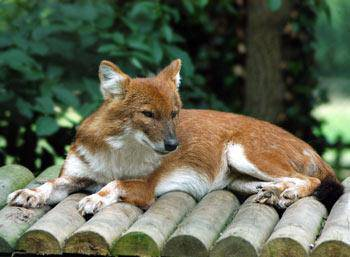

In [ ]:
image

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

now we have seen how a image looks as a tensor, lets make a function to process them:

1. take a image filepath as input
2. Use tensorflow to read the file and save it to a variable. `image`
3. turn our image (a jpg) to tensors
4. Normalize our image ( convert color channels from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224)
6. return the modified images

In [ ]:
# define image size
IMG_SIZE = 224

# create a function to process images
def process_image(image_path, img_size=IMG_SIZE):
  """
  takes an image file path and turns into a tensor.
  """
  # read an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical tensor with 3 color channels RGB
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channels from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired size (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## turning our data into batches

why to turn our data into batches?

lets say you are trying to process 10k+ images in one go.. they all might not fit into memory

thats why we do about 32 (batch size=32) images a time. you can manually adjust the batch size.

in order to use Tensorflow effectively, we need our data in the form of tensor tuples which look like this:
`(image,label)`

In [ ]:
# create a simple fuction to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  takes an image filepath name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of tensors in form: `(image,label)`, lets make a funtion to turn our data ( X & y ) into batches!

In [ ]:
# define the batch size, 32
BATCH_SIZE = 32

# create a function to turn data into batches
def create_data_batches(X, y, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  creates batches of data out of image (X) and label (y) pairs.
  shuffles the data if training data but doesnt shuffle the validation data
  also accepts thest data as input (no labels).
  """

  # if the data is a test dataset, we probably wont have any labels
  if test_data:
    y=None
    print("creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we dont need to shuffle it
  if valid_data:
    print("creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # if the data is traing dataset
  else:
    print("creating training data batches...")
    # turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # shuffling pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size=len(X))
    # create (image,label) tuples ( this also turns image path into preprocessed)
    data = data.map(get_image_label)
    # turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

creating training data batches...
creating validation data batches...


In [ ]:
# check out different attributes of the data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualizing data batches

our data is now in batches, however it is a little hand to understand, lets visualize it

In [ ]:
import matplotlib.pyplot as plt

# create a function for viewing images in data batch
def show_25_images(images, labels):
  """
  displays a plot of 25 images and their labels from a data batch
  """
  # set up a figure
  plt.figure(figsize=(10,10))
  # loop through 25( for displaying 25 images)
  for i in range(25):
    # create subplots: 5 rows 5 columns
    ax = plt.subplot(5,5,i+1)
    # display image
    plt.imshow(images[i])
    # add image label
    plt.title(unique_breeds[labels[i].argmax()])
    # turn off the axis
    plt.axis("off")


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images),len( train_labels)

(32, 32)

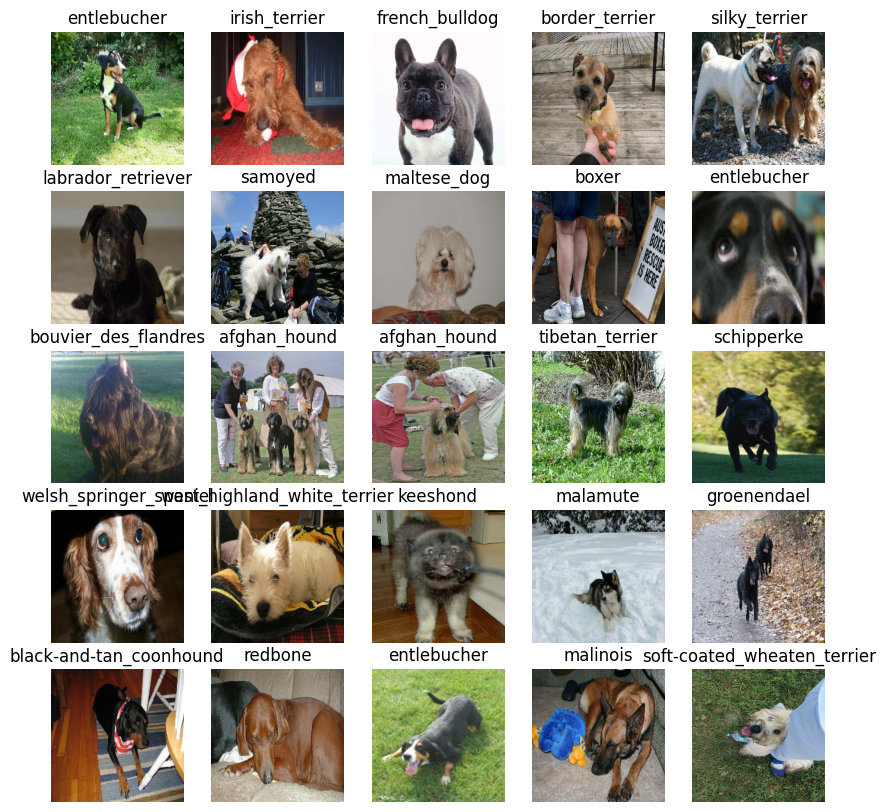

In [ ]:
# now lets visualize the data in a training batch
show_25_images(train_images, train_labels)

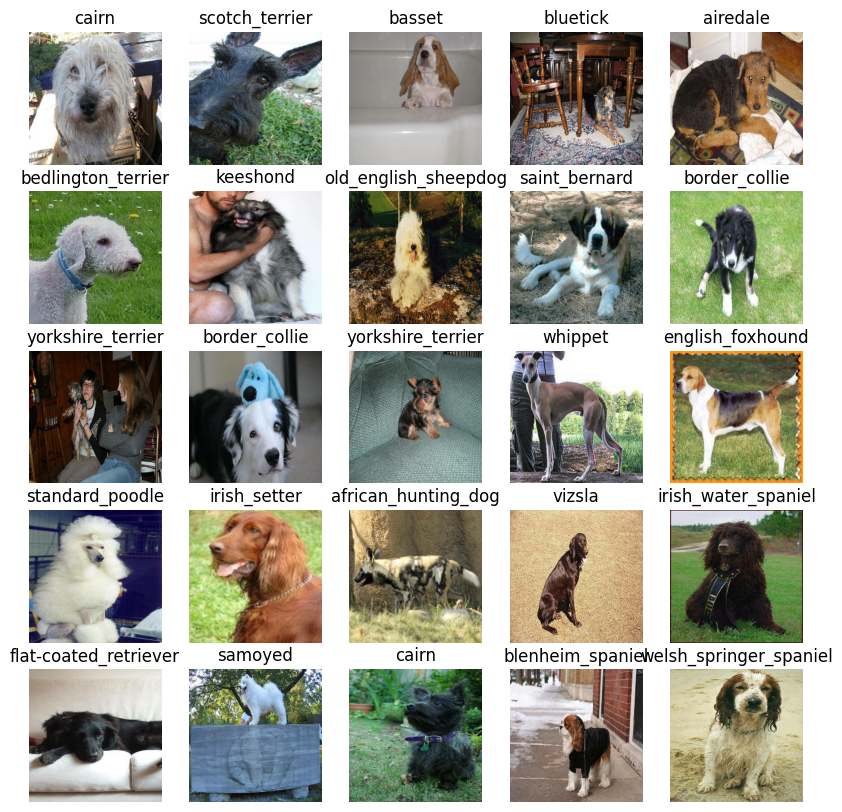

In [ ]:
# now lets visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## building a model

Before we build a model, there are a few things we need to define:
* the input shape (our images shape, in the form of Tensors) to our model.
* the output shape ( image labels, in the form of tensors) of our model.
* the URL of the model we want to use, from tensorflow hub: `
https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification`


In [ ]:
# Set up input shape to the model
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# set up the output shape
OUTPUT_SHAPE=len(unique_breeds)

# setup URL from Tensorflow hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

#

now we have got our inputs, outputs and model ready to go. lets put tehm togther into keras deep learning model!

knowing this, lets create a function which:
* takes the input shape, output shape and the model we've chosen as parameters.
* defines the layers in a keras model in sequential fashion (do this first, then this, then that).
* compiles the model ( says it should be evaluated and improved).
* builds the model ( tells the model input shape it'll be getting).
* returns the model.

all of these steps can be found in:
https://www.tensorflow.org/guide/keras/overview

In [ ]:
# create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print(f"building model with {model_url}")

  # setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 = input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # layer 2 = output layer
  ])

  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # build a model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## creating callbacks

callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a modle stops improving

we will create 2 callbacks:
1. for tensorBoard which helps tracks our models progress
2. for early stopping which prevents our model from training for too long.

### TensorBoard callback

to setup a tensor board callback, we need to do 3 things:
1. load the tensorboard notebook extension
2. create a tensorboard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. visualize our models training logs with the `%tensorboard` magic function ( we will do this after model training )

In [ ]:
# load tensor board notebook extension

%load_ext tensorboard

In [ ]:
import datetime

#  create a function to build tensorboard call back
def create_tensorboard_callback():
  # create a log directory for storing tensor board logs
  logdir = os.path.join("drive/MyDrive/dog vision/logs", # make it so the logs get tracked whenever we run a experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# create early stopping call back
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                    patience=3)

## training a model ( on a subset of data)

our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
tf.config.list_physical_devices('GPU')

[]

lets create a function which trains a model.

* create a model using `create_model()`
* setup a tensorboard callback using `create_tensorboard_callback()`
* call the `fit()` function on our model passing it the training data, validation data, no of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use
* return the model

In [ ]:
# build a function to train and return a trained model
def train_model():
  """
  trains a given model and returns the trained version
  """
  # create a model
  model = create_model()

  # create a tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # return the fitted model
  return model

In [ ]:
# fit the model to the data
model = train_model()

building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100


KeyboardInterrupt: 

**question:** it looks like our model is overfitting because its performing way better on training dataset than on validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

### checking the tensor board logs

the tensorboard magic funtion (`%tensorboard`) will access the logs directory we created earlier and visualise its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## making and evaluating predictions using a trained model

In [ ]:
# make predictions on validation data
predictions = model.predict(val_data, verbose=1)
predictions

NameError: name 'model' is not defined

In [ ]:
predictions.shape

(200, 120)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# first prediction
index = 0
print(predictions[index])
print(f"max value (probability of prediction): {np.max(predictions[index])} ")
print(f"sum: {np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.37614878e-03 7.42958800e-05 1.38155068e-03 1.12344773e-04
 5.14508341e-04 3.91128124e-05 2.71034110e-02 2.88420846e-03
 1.26747633e-04 1.11027708e-04 6.90615911e-04 4.28877174e-05
 1.34505134e-03 1.89317107e-05 3.60652426e-04 9.23047890e-04
 4.10530556e-05 1.76134616e-01 4.92011750e-05 1.40900418e-04
 6.36212470e-04 5.91915159e-04 1.01615769e-05 2.50591547e-03
 5.98125553e-05 1.53529632e-04 1.37335166e-01 1.18850156e-04
 2.80671142e-04 1.45208463e-03 1.52369874e-04 1.15756539e-03
 5.68323594e-04 8.85190912e-06 4.04581187e-05 9.12470371e-02
 1.16489500e-05 2.55273753e-05 2.66361807e-04 1.20646218e-04
 9.46149696e-04 6.22469906e-06 2.96436356e-05 5.16493492e-05
 2.37470231e-05 1.95845041e-05 7.07615300e-06 1.48488834e-04
 2.05875767e-04 2.51701567e-04 2.76479637e-04 7.16079012e-05
 1.25487521e-03 3.10291944e-05 6.52639064e-05 2.45019091e-05
 4.79501119e-04 1.94591365e-03 1.50989683e-04 6.97380677e-02
 3.88483342e-04 5.70860357e-06 1.54047005e-03 1.61036605e-05
 3.50344955e-04 4.762814

having the above functionality is great but we want it to be able to do it at scale.

and it would be even better if we could see the image the prediction is being made on!

**note:** prediction probabilites are also known as confidence levels

In [ ]:
# turn prediction probabilites into their respective label( easier to understand)

def get_pred_label(prediction_probabilites):
  """
  takes an array of prediction probabilites and returns the predicted label
  """
  return unique_breeds[np.argmax(prediction_probabilites)]



In [ ]:
# get a predicted label based on an array of prediction probabilites
pred_label = get_pred_label(predictions[81])
pred_label

nowsince our validation data is still in batch dataset, we will have to un batchify it to make predictions on the validation images and then compare those predictions to the validation labels( truth labels)

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create a function to unbatch a batch dataset
def unbatchify(data):
  """
  takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

now we have got ways to get:
* preditcion label
* validation labels ( truth labels)
* validation images

lets make some function to make these all a bit more visualize

we will create a function which:
* takes an array of prediction probabilites, an array of truth labels and an array of images and integers.
* convert the prediction probabilites to a predicted label.
* plot the predicted label, its predicted probability, the truth label and the target image on a single plot

In [ ]:
def plot_pred(prediction_probabilites, labels, images,n=1):
  """
  view the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilites[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                              np.max(pred_prob)*100,
                              true_label),
                                    color=color)

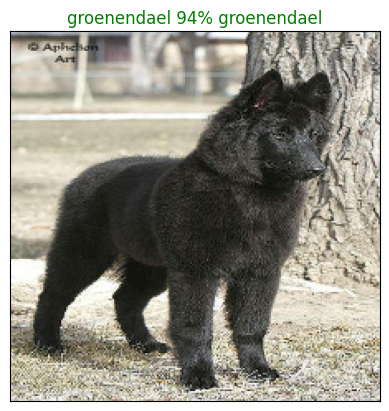

In [ ]:
plot_pred(prediction_probabilites=predictions,
          labels=val_labels,
          images= val_images,
          n=45
          )

now we have got one function to visualise our models top prediction, lets make another to view our models top 10 predictions.

this function will:
* take an input of prediction probabilites array and a ground truth array and an integer
* find the predictions using `get_pred_label()`
* find the top 10:
  * prediction probabilites indexes
  * prediction probabilities values
  * prediction labels
* plot the top 10 prediction probability values and labels, colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilites, labels, n=1):
  """
  plot the top 10 highest prediction confidences along with teh truth label for sample n
  """
  pred_prob, true_label = prediction_probabilites[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidences indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the top 10 prediction confidences values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels= top_10_pred_labels,
             rotation="vertical")
  # change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

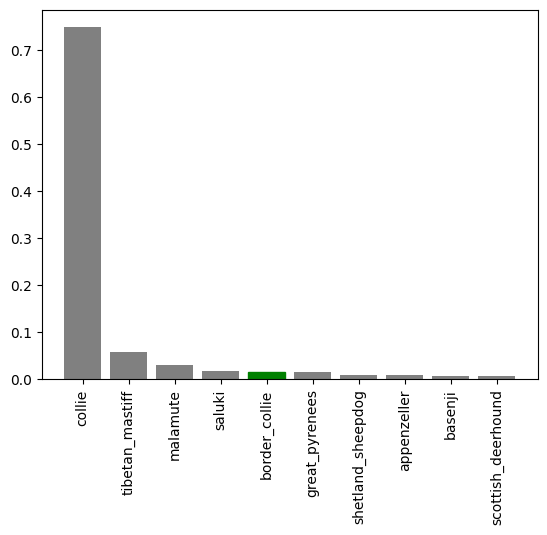

In [ ]:
plot_pred_conf(prediction_probabilites=predictions,
               labels=val_labels,
               n=9
               )

now we have got some functions to help us visualise some predictions and evaluate our models, lets check out a few.

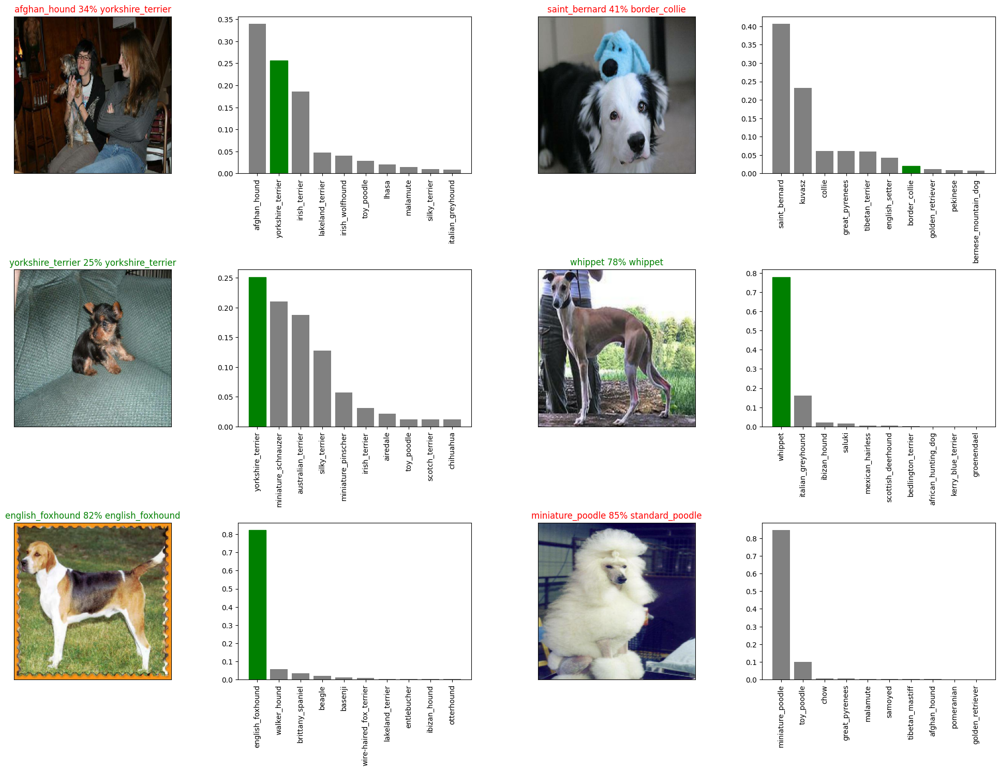

In [ ]:
# lets check out a few predictions and their different values
i_multiplier=10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilites=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilites=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## saving and reloading a trained model

In [ ]:
# create a function to save a model
def save_model( model,suffix=None):
  """
  saves a given model in models directory and appends a suffix ( string)
  """
  # create model directory with current time
  modeldir = os.path.join("drive/MyDrive/dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# create a model to load a model
def load_model(model_path):
  """
  loads a saved model from a specified path
  """
  print(f"loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

now we have got functions to save and load model. lets test it

In [ ]:
# save our model trained on 1000 images
save_model(model, suffix="1000_images_mobilenetv2_adam")

saving model to: drive/MyDrive/dog vision/models/20240617-175650-1000_images_mobilenetv2_adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog vision/models/20240617-175650-1000_images_mobilenetv2_adam.h5'

In [ ]:
# load a trained model
loaded_1000_images_model = load_model("drive/MyDrive/dog vision/models/20240617-071923-1000_images_mobilenetv2_adam.h5")

loading saved model from: drive/MyDrive/dog vision/models/20240617-071923-1000_images_mobilenetv2_adam.h5


In [ ]:
# evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 12s 2s/step - loss: 1.2513 - accuracy: 0.6900


[1.2512747049331665, 0.6899999976158142]

In [ ]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.1781 - accuracy: 0.6850


[1.1781187057495117, 0.6850000023841858]

## training a big dog model ( i.e. on full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# create a data batch with full data set
full_data = create_data_batches(X,y)

creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

building model with https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# no validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                                patience=3)

**note:** running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we are using in the run time has to load all the images into memory

In [ ]:
# fit the full model to the full data
full_model.fit(x=full_data,
            epochs=NUM_EPOCHS,
            callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
 46/320 [===>..........................] - ETA: 8:53 - loss: 3.5722 - accuracy: 0.2622

KeyboardInterrupt: 

In [ ]:
# save our model trained on 10K images
save_model(model, suffix="full_image_set_mobilenetv2_adam.h5")

In [ ]:
# load in the full model
loaded_full_model = load_model("/content/drive/MyDrive/dog vision/models/20240617-145644-full_image_set_mobilenetv2_adam.h5")

loading saved model from: /content/drive/MyDrive/dog vision/models/20240617-145644-full_image_set_mobilenetv2_adam.h5


## making predictions on the test dataset

since our model has been trained on images in the form of tensor batches, to make predictions on the test data, we will have to get it into same format.

luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into tensor batches

to make predictions on the test data, we'll:
* get the test image filenames
* convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to True( since the test data doesnt have labels)
* make a prediction array by passing the test batches to the predict() method called on our model.

In [ ]:
# load test image filenames
test_path = "/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/"
test_filenames = [test_path + filename for filename in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e751e319cfdc9912ae2e5da2a9b053e0.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e7a1b7a42db97df750aeae212a02d9c4.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e7b357150635c250757363718e4dae86.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e70c62f51defaa5295fe3e52099c4ce3.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e816f0027a2c6348dbf12b79c70541bc.jpg',
 '/content/drive/MyDrive/dog vision/dog-breed-identification (1)/test/e732916519751eaa0cb2ba0cc1217ab9.jpg',
 '/content/drive/My

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames,y=None, test_data=True)


creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

note: calling predict() on our full model and passing it the test data batch will take a loong time to run ( about an hour )

In [ ]:
# make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

  5/324 [..............................] - ETA: 25:31

In [ ]:
# save predictions ( numpy array ) to a csv file ( for access later)
np.savetxt("/content/drive/MyDrive/dog vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:
# load predictions ( numpy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/dog vision/test_predictions.csv", delimiter=",")

In [ ]:
test_predictions.shape

## preparing test dataset predictions for kaggle

looking at the kaggle sample submission, we find that it wants our models prediction probability outputs in a dataframe with an ID and a column for each different dog breed.

to get the data in this format, we will:
* crate a pandas dataframe with an ID column as well as a column for each dog breed
* add data to the ID column by extracting the test image IDs from their filepaths
* add data (the prediction probabilites) to each of the dog breed columns
* export the dataframe as a csv

In [ ]:
list(unique_breeds)

NameError: name 'unique_breeds' is not defined

In [ ]:
# create a pandas dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

In [ ]:
# append test image ids to predicttons dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

In [ ]:
# add the prediction probabilites to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

In [ ]:
# save our predictions dataframe to csv for submission
preds_df.to_csv("/content/drive/MyDrive/dog vision/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

## making predictions on custom images

to make predictions on custom images, we'll:
* get the file paths of our own images.
* turn the file paths into data batches using `create_data_batches()` and since our custom images wont have labels, we set the `test_data` parameter to `true`.
* we pass the custom image data batch to our model's `predict()` method
* convert the prediction probabilites to prediction labels
* compare the predicted labels to custom images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')  # Ensure Google Drive is mounted

# get custom image filepaths
custom_path = "/content/drive/MyDrive/dog vision/Custom images/"  # Add trailing slash
custom_image_paths = [custom_path + filename for filename in os.listdir(custom_path)]

# Verify file paths
import os
for path in custom_image_paths:
    if not os.path.exists(path):
        print(f"File not found: {path}")

# ... rest of your code ...

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
custom_image_paths

['/content/drive/MyDrive/dog vision/Custom imagesScreenshot_20240617_211018_Google.jpg',
 '/content/drive/MyDrive/dog vision/Custom imagesScreenshot_20240617_211049_Google.jpg',
 '/content/drive/MyDrive/dog vision/Custom images.ipynb_checkpoints']

In [ ]:
# turn custom images to data batches
custom_data = create_data_batches(custom_image_paths,y=None, test_data=True)
custom_data

creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 739ms/step


In [ ]:
custom_preds.shape

(2, 120)

In [ ]:
# get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow', 'saint_bernard']

In [ ]:
# get custom images (our batchify() function wont work since there arent any labels.. we will fix this later)
custom_images = []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

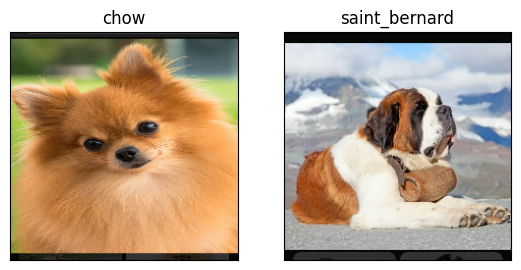

In [ ]:
# check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)